In [1]:
import os
import json
import math
import numpy as np
import pandas as pd

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()
sns.set()


## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.utils import save_image
from torchvision.datasets import FashionMNIST
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from torch.nn.functional import one_hot

from pytorch_fid import fid_score

/tmp/ipykernel_9692/2475230352.py:11: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export
/usr/local/lib/python3.10/dist-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The to

In [2]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Device:", device)

Device: cuda


In [3]:
transform = v2.Compose(
    [
     v2.ToTensor(),
     #v2.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

train_data = ImageFolder('./trafic_32', transform=transform)
train_classes = train_data.classes
train_classes = [name.lstrip('0') if name != '00000' else '0' for name in train_classes]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `transforms.Compose([transforms.ToImageTensor(), transforms.ConvertImageDtype()])`.
  warnings.warn(


In [4]:
train_loader = data.DataLoader(train_data, batch_size=256, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)

In [5]:
data, classes = next(iter(train_loader))
classes[0]

tensor(3)

## GAN

In [7]:
NUBMER_OF_CLASSES = 43

In [8]:
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Discriminator, self).__init__()

        self.fc_1 = nn.Linear(input_dim + NUBMER_OF_CLASSES, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_out  = nn.Linear(hidden_dim, 1)

        self.LeakyReLU = nn.LeakyReLU(0.2)

    def forward(self, x, classes_encoded):
        # x = x.permute(0, 2, 3, 1)
        x = torch.flatten(x, 1)
        x = torch.concat((x, classes_encoded), dim=1)
        # x = x.permute(1, 0)

        x = self.LeakyReLU(self.fc_1(x))
        x = self.LeakyReLU(self.fc_2(x))
        x = self.fc_out(x)
        return x

In [62]:
class Generator(nn.Module):
    def __init__(self, latent_dim, hidden_dim1, hidden_dim2, output_dim):
        super(Generator, self).__init__()
        self.fc_1 = nn.Linear(latent_dim + NUBMER_OF_CLASSES, hidden_dim1)
        self.fc_2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.conv1 = nn.ConvTranspose2d(in_channels=3, out_channels=64, kernel_size=16, stride=1, padding=7)
        self.conv2 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=9, stride=1, padding=4)
        self.conv3 = nn.ConvTranspose2d(in_channels=32, out_channels=3, kernel_size=8, stride=1, padding=4)


        self.fc_4 = nn.Linear(hidden_dim2, output_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim1)
        self.bn2 = nn.BatchNorm1d(hidden_dim2)
        self.bn2d1 = nn.BatchNorm2d(64)
        self.bn2d2 = nn.BatchNorm2d(32)


        self.LeakyReLU = nn.LeakyReLU(0.2)

    def forward(self, x, classes_encoded):
        h = torch.concat((x, classes_encoded), dim=1)

        h     = self.LeakyReLU(self.fc_1(h))
        h = self.bn1(h)
        h     = self.LeakyReLU(self.fc_2(h))
        h = self.bn2(h)



        x_hat = torch.sigmoid(self.fc_4(h))
        x_hat = x_hat.view([-1, 3, 32, 32])
        x = self.conv1(self.LeakyReLU(x_hat))
        x = self.bn2d1(x)
        x = self.conv2(self.LeakyReLU(x))
        x = self.bn2d2(x)
        x = self.conv3(self.LeakyReLU(x))
        # x = self.conv4(self.LeakyReLU(x))
        # x = torch.flatten(x, 1) # flatten all dimensions except batch
        # x = x.view([-1, 3, 32, 32])
        # x = x.permute(0, 2, 3, 1)
        x = torch.sigmoid(x)

        return x

In [63]:
# Models
latent_dim = 32
generator = Generator(latent_dim=latent_dim, hidden_dim1=128, hidden_dim2=64, output_dim=3072).to(device)
discriminator = Discriminator( hidden_dim=256, input_dim=3072).to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0001)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()

In [64]:
def get_classes_encoded(train_classes: list, classes_names: list, encoding):
    return torch.stack([encoding[train_classes.index(str(name.item()))] for name in classes_names], dim=0)

In [65]:
def combine(images, encodings):
    encodings = encodings.unsqueeze(0).unsqueeze(1).unsqueeze(2).unsqueeze(3)
    encodings = encodings.expand(254, 3, 32, 32, 43)

In [66]:
encoding = one_hot(torch.arange(0, 43), 43)

In [67]:
fixed_noise = torch.randn(8, latent_dim,device=device)

In [68]:
G_losses = []
D_losses = []
DF_acc = []
DR_acc = []
num_epochs = 1000

Epoch: 0, discrimiantor fake error: 0.323, discriminator real acc: 0.352


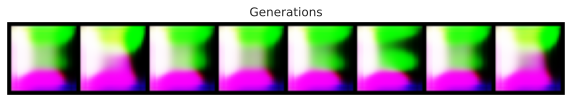

Epoch: 1, discrimiantor fake error: 0.147, discriminator real acc: 0.606
Epoch: 2, discrimiantor fake error: 0.0689, discriminator real acc: 0.733
Epoch: 3, discrimiantor fake error: 0.0926, discriminator real acc: 0.757
Epoch: 4, discrimiantor fake error: 0.0926, discriminator real acc: 0.766
Epoch: 5, discrimiantor fake error: 0.0886, discriminator real acc: 0.797
Epoch: 6, discrimiantor fake error: 0.0764, discriminator real acc: 0.835
Epoch: 7, discrimiantor fake error: 0.0626, discriminator real acc: 0.851
Epoch: 8, discrimiantor fake error: 0.0561, discriminator real acc: 0.889
Epoch: 9, discrimiantor fake error: 0.0482, discriminator real acc: 0.926
Epoch: 10, discrimiantor fake error: 0.059, discriminator real acc: 0.917


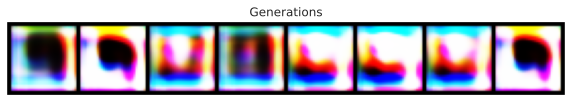

Epoch: 11, discrimiantor fake error: 0.0431, discriminator real acc: 0.935
Epoch: 12, discrimiantor fake error: 0.0422, discriminator real acc: 0.943
Epoch: 13, discrimiantor fake error: 0.0496, discriminator real acc: 0.941
Epoch: 14, discrimiantor fake error: 0.0498, discriminator real acc: 0.937
Epoch: 15, discrimiantor fake error: 0.063, discriminator real acc: 0.921
Epoch: 16, discrimiantor fake error: 0.0565, discriminator real acc: 0.936
Epoch: 17, discrimiantor fake error: 0.0569, discriminator real acc: 0.936
Epoch: 18, discrimiantor fake error: 0.0576, discriminator real acc: 0.942
Epoch: 19, discrimiantor fake error: 0.0772, discriminator real acc: 0.931
Epoch: 20, discrimiantor fake error: 0.0866, discriminator real acc: 0.927


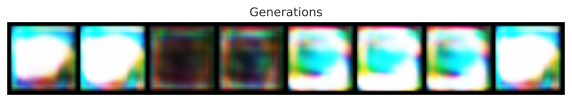

Epoch: 21, discrimiantor fake error: 0.0946, discriminator real acc: 0.898
Epoch: 22, discrimiantor fake error: 0.0881, discriminator real acc: 0.914
Epoch: 23, discrimiantor fake error: 0.0923, discriminator real acc: 0.913
Epoch: 24, discrimiantor fake error: 0.0948, discriminator real acc: 0.901
Epoch: 25, discrimiantor fake error: 0.103, discriminator real acc: 0.897
Epoch: 26, discrimiantor fake error: 0.09, discriminator real acc: 0.91
Epoch: 27, discrimiantor fake error: 0.0897, discriminator real acc: 0.902
Epoch: 28, discrimiantor fake error: 0.104, discriminator real acc: 0.904
Epoch: 29, discrimiantor fake error: 0.11, discriminator real acc: 0.9
Epoch: 30, discrimiantor fake error: 0.113, discriminator real acc: 0.899


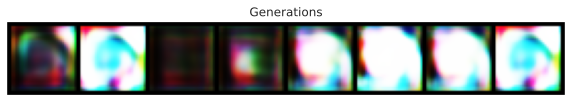

Epoch: 31, discrimiantor fake error: 0.13, discriminator real acc: 0.881
Epoch: 32, discrimiantor fake error: 0.139, discriminator real acc: 0.866
Epoch: 33, discrimiantor fake error: 0.158, discriminator real acc: 0.864
Epoch: 34, discrimiantor fake error: 0.173, discriminator real acc: 0.849
Epoch: 35, discrimiantor fake error: 0.142, discriminator real acc: 0.863
Epoch: 36, discrimiantor fake error: 0.183, discriminator real acc: 0.835
Epoch: 40, discrimiantor fake error: 0.191, discriminator real acc: 0.805


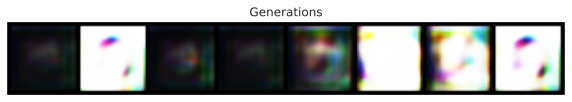

Epoch: 41, discrimiantor fake error: 0.187, discriminator real acc: 0.825
Epoch: 42, discrimiantor fake error: 0.221, discriminator real acc: 0.789
Epoch: 43, discrimiantor fake error: 0.21, discriminator real acc: 0.795
Epoch: 44, discrimiantor fake error: 0.211, discriminator real acc: 0.798
Epoch: 45, discrimiantor fake error: 0.194, discriminator real acc: 0.803
Epoch: 46, discrimiantor fake error: 0.207, discriminator real acc: 0.803
Epoch: 47, discrimiantor fake error: 0.215, discriminator real acc: 0.811
Epoch: 48, discrimiantor fake error: 0.187, discriminator real acc: 0.801
Epoch: 49, discrimiantor fake error: 0.217, discriminator real acc: 0.796
Epoch: 50, discrimiantor fake error: 0.206, discriminator real acc: 0.796


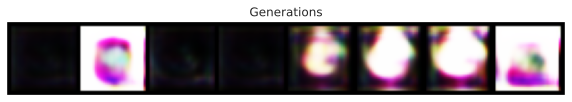

Epoch: 51, discrimiantor fake error: 0.2, discriminator real acc: 0.81
Epoch: 52, discrimiantor fake error: 0.166, discriminator real acc: 0.841
Epoch: 53, discrimiantor fake error: 0.195, discriminator real acc: 0.818
Epoch: 54, discrimiantor fake error: 0.184, discriminator real acc: 0.822
Epoch: 55, discrimiantor fake error: 0.228, discriminator real acc: 0.775
Epoch: 56, discrimiantor fake error: 0.202, discriminator real acc: 0.811
Epoch: 57, discrimiantor fake error: 0.199, discriminator real acc: 0.806
Epoch: 58, discrimiantor fake error: 0.203, discriminator real acc: 0.79
Epoch: 59, discrimiantor fake error: 0.196, discriminator real acc: 0.789
Epoch: 60, discrimiantor fake error: 0.22, discriminator real acc: 0.795


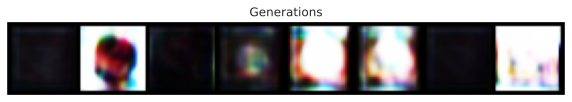

Epoch: 61, discrimiantor fake error: 0.207, discriminator real acc: 0.798
Epoch: 62, discrimiantor fake error: 0.185, discriminator real acc: 0.821
Epoch: 63, discrimiantor fake error: 0.213, discriminator real acc: 0.791
Epoch: 64, discrimiantor fake error: 0.194, discriminator real acc: 0.802
Epoch: 65, discrimiantor fake error: 0.239, discriminator real acc: 0.773
Epoch: 66, discrimiantor fake error: 0.205, discriminator real acc: 0.798
Epoch: 67, discrimiantor fake error: 0.206, discriminator real acc: 0.785
Epoch: 68, discrimiantor fake error: 0.189, discriminator real acc: 0.82
Epoch: 69, discrimiantor fake error: 0.204, discriminator real acc: 0.799
Epoch: 70, discrimiantor fake error: 0.208, discriminator real acc: 0.788


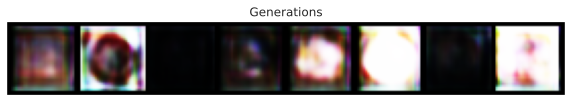

Epoch: 71, discrimiantor fake error: 0.207, discriminator real acc: 0.802
Epoch: 72, discrimiantor fake error: 0.187, discriminator real acc: 0.813
Epoch: 73, discrimiantor fake error: 0.216, discriminator real acc: 0.792
Epoch: 74, discrimiantor fake error: 0.204, discriminator real acc: 0.802
Epoch: 75, discrimiantor fake error: 0.195, discriminator real acc: 0.816
Epoch: 76, discrimiantor fake error: 0.226, discriminator real acc: 0.775
Epoch: 77, discrimiantor fake error: 0.21, discriminator real acc: 0.781
Epoch: 78, discrimiantor fake error: 0.222, discriminator real acc: 0.789
Epoch: 79, discrimiantor fake error: 0.209, discriminator real acc: 0.788
Epoch: 80, discrimiantor fake error: 0.218, discriminator real acc: 0.774


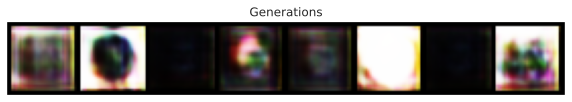

Epoch: 81, discrimiantor fake error: 0.212, discriminator real acc: 0.801
Epoch: 82, discrimiantor fake error: 0.213, discriminator real acc: 0.776
Epoch: 83, discrimiantor fake error: 0.208, discriminator real acc: 0.799
Epoch: 84, discrimiantor fake error: 0.186, discriminator real acc: 0.812
Epoch: 85, discrimiantor fake error: 0.206, discriminator real acc: 0.801
Epoch: 86, discrimiantor fake error: 0.188, discriminator real acc: 0.816
Epoch: 87, discrimiantor fake error: 0.206, discriminator real acc: 0.788
Epoch: 88, discrimiantor fake error: 0.197, discriminator real acc: 0.815
Epoch: 89, discrimiantor fake error: 0.21, discriminator real acc: 0.782
Epoch: 90, discrimiantor fake error: 0.199, discriminator real acc: 0.802


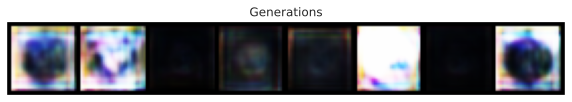

Epoch: 91, discrimiantor fake error: 0.202, discriminator real acc: 0.807
Epoch: 92, discrimiantor fake error: 0.22, discriminator real acc: 0.782
Epoch: 93, discrimiantor fake error: 0.213, discriminator real acc: 0.793
Epoch: 94, discrimiantor fake error: 0.21, discriminator real acc: 0.799
Epoch: 95, discrimiantor fake error: 0.188, discriminator real acc: 0.814
Epoch: 96, discrimiantor fake error: 0.216, discriminator real acc: 0.784
Epoch: 97, discrimiantor fake error: 0.215, discriminator real acc: 0.788
Epoch: 98, discrimiantor fake error: 0.222, discriminator real acc: 0.777
Epoch: 99, discrimiantor fake error: 0.213, discriminator real acc: 0.79
Epoch: 100, discrimiantor fake error: 0.221, discriminator real acc: 0.792


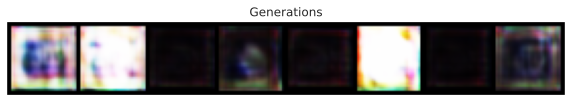

Epoch: 101, discrimiantor fake error: 0.223, discriminator real acc: 0.778
Epoch: 102, discrimiantor fake error: 0.22, discriminator real acc: 0.773
Epoch: 103, discrimiantor fake error: 0.216, discriminator real acc: 0.798
Epoch: 104, discrimiantor fake error: 0.213, discriminator real acc: 0.787
Epoch: 105, discrimiantor fake error: 0.222, discriminator real acc: 0.78
Epoch: 106, discrimiantor fake error: 0.228, discriminator real acc: 0.778
Epoch: 107, discrimiantor fake error: 0.208, discriminator real acc: 0.791
Epoch: 108, discrimiantor fake error: 0.215, discriminator real acc: 0.781
Epoch: 109, discrimiantor fake error: 0.202, discriminator real acc: 0.801
Epoch: 110, discrimiantor fake error: 0.216, discriminator real acc: 0.789


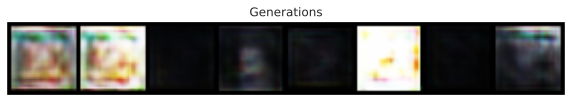

Epoch: 111, discrimiantor fake error: 0.23, discriminator real acc: 0.764
Epoch: 112, discrimiantor fake error: 0.223, discriminator real acc: 0.781
Epoch: 113, discrimiantor fake error: 0.223, discriminator real acc: 0.777
Epoch: 114, discrimiantor fake error: 0.219, discriminator real acc: 0.792
Epoch: 115, discrimiantor fake error: 0.228, discriminator real acc: 0.773
Epoch: 116, discrimiantor fake error: 0.207, discriminator real acc: 0.793
Epoch: 117, discrimiantor fake error: 0.206, discriminator real acc: 0.79
Epoch: 118, discrimiantor fake error: 0.236, discriminator real acc: 0.774
Epoch: 119, discrimiantor fake error: 0.224, discriminator real acc: 0.782
Epoch: 120, discrimiantor fake error: 0.213, discriminator real acc: 0.791


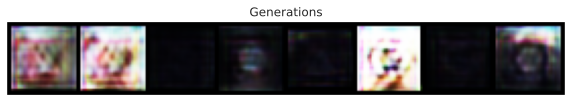

Epoch: 121, discrimiantor fake error: 0.225, discriminator real acc: 0.773
Epoch: 122, discrimiantor fake error: 0.22, discriminator real acc: 0.782
Epoch: 123, discrimiantor fake error: 0.216, discriminator real acc: 0.791
Epoch: 124, discrimiantor fake error: 0.188, discriminator real acc: 0.82
Epoch: 125, discrimiantor fake error: 0.212, discriminator real acc: 0.789
Epoch: 126, discrimiantor fake error: 0.22, discriminator real acc: 0.79
Epoch: 127, discrimiantor fake error: 0.203, discriminator real acc: 0.801
Epoch: 128, discrimiantor fake error: 0.232, discriminator real acc: 0.775
Epoch: 129, discrimiantor fake error: 0.221, discriminator real acc: 0.78
Epoch: 130, discrimiantor fake error: 0.215, discriminator real acc: 0.788


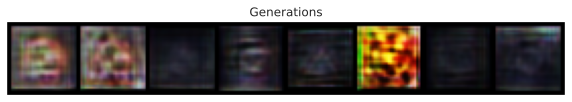

Epoch: 131, discrimiantor fake error: 0.223, discriminator real acc: 0.773
Epoch: 132, discrimiantor fake error: 0.213, discriminator real acc: 0.792
Epoch: 133, discrimiantor fake error: 0.215, discriminator real acc: 0.796
Epoch: 134, discrimiantor fake error: 0.211, discriminator real acc: 0.795
Epoch: 135, discrimiantor fake error: 0.223, discriminator real acc: 0.779
Epoch: 136, discrimiantor fake error: 0.217, discriminator real acc: 0.788
Epoch: 137, discrimiantor fake error: 0.214, discriminator real acc: 0.791
Epoch: 138, discrimiantor fake error: 0.219, discriminator real acc: 0.788
Epoch: 139, discrimiantor fake error: 0.221, discriminator real acc: 0.778
Epoch: 140, discrimiantor fake error: 0.224, discriminator real acc: 0.776


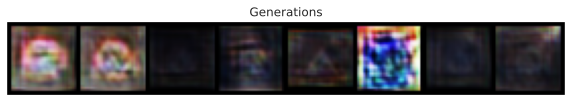

Epoch: 141, discrimiantor fake error: 0.231, discriminator real acc: 0.774
Epoch: 142, discrimiantor fake error: 0.222, discriminator real acc: 0.783
Epoch: 143, discrimiantor fake error: 0.22, discriminator real acc: 0.78
Epoch: 144, discrimiantor fake error: 0.21, discriminator real acc: 0.784
Epoch: 145, discrimiantor fake error: 0.241, discriminator real acc: 0.762
Epoch: 146, discrimiantor fake error: 0.233, discriminator real acc: 0.768
Epoch: 147, discrimiantor fake error: 0.239, discriminator real acc: 0.766
Epoch: 148, discrimiantor fake error: 0.217, discriminator real acc: 0.785
Epoch: 149, discrimiantor fake error: 0.227, discriminator real acc: 0.774
Epoch: 150, discrimiantor fake error: 0.225, discriminator real acc: 0.771


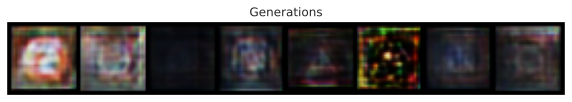

Epoch: 151, discrimiantor fake error: 0.246, discriminator real acc: 0.762
Epoch: 152, discrimiantor fake error: 0.229, discriminator real acc: 0.777
Epoch: 153, discrimiantor fake error: 0.222, discriminator real acc: 0.785
Epoch: 154, discrimiantor fake error: 0.236, discriminator real acc: 0.761
Epoch: 155, discrimiantor fake error: 0.237, discriminator real acc: 0.758
Epoch: 156, discrimiantor fake error: 0.23, discriminator real acc: 0.774
Epoch: 157, discrimiantor fake error: 0.241, discriminator real acc: 0.754
Epoch: 158, discrimiantor fake error: 0.219, discriminator real acc: 0.782
Epoch: 159, discrimiantor fake error: 0.245, discriminator real acc: 0.76
Epoch: 160, discrimiantor fake error: 0.239, discriminator real acc: 0.766


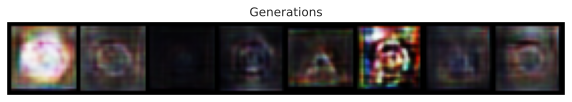

Epoch: 161, discrimiantor fake error: 0.244, discriminator real acc: 0.758
Epoch: 162, discrimiantor fake error: 0.238, discriminator real acc: 0.765
Epoch: 163, discrimiantor fake error: 0.231, discriminator real acc: 0.772
Epoch: 164, discrimiantor fake error: 0.235, discriminator real acc: 0.765
Epoch: 165, discrimiantor fake error: 0.236, discriminator real acc: 0.768
Epoch: 166, discrimiantor fake error: 0.237, discriminator real acc: 0.766
Epoch: 167, discrimiantor fake error: 0.234, discriminator real acc: 0.778
Epoch: 168, discrimiantor fake error: 0.235, discriminator real acc: 0.76
Epoch: 169, discrimiantor fake error: 0.234, discriminator real acc: 0.765
Epoch: 170, discrimiantor fake error: 0.237, discriminator real acc: 0.767


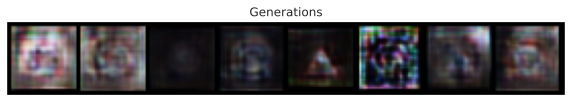

Epoch: 171, discrimiantor fake error: 0.245, discriminator real acc: 0.758
Epoch: 172, discrimiantor fake error: 0.236, discriminator real acc: 0.768
Epoch: 173, discrimiantor fake error: 0.244, discriminator real acc: 0.756
Epoch: 174, discrimiantor fake error: 0.235, discriminator real acc: 0.764
Epoch: 175, discrimiantor fake error: 0.236, discriminator real acc: 0.769
Epoch: 176, discrimiantor fake error: 0.229, discriminator real acc: 0.782
Epoch: 177, discrimiantor fake error: 0.226, discriminator real acc: 0.771
Epoch: 178, discrimiantor fake error: 0.236, discriminator real acc: 0.766
Epoch: 179, discrimiantor fake error: 0.238, discriminator real acc: 0.765
Epoch: 180, discrimiantor fake error: 0.234, discriminator real acc: 0.766


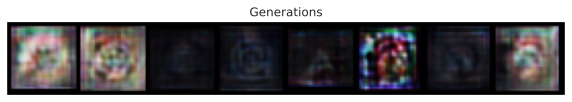

Epoch: 181, discrimiantor fake error: 0.231, discriminator real acc: 0.768
Epoch: 182, discrimiantor fake error: 0.234, discriminator real acc: 0.77
Epoch: 183, discrimiantor fake error: 0.22, discriminator real acc: 0.777
Epoch: 184, discrimiantor fake error: 0.229, discriminator real acc: 0.77
Epoch: 185, discrimiantor fake error: 0.236, discriminator real acc: 0.77
Epoch: 186, discrimiantor fake error: 0.249, discriminator real acc: 0.75
Epoch: 187, discrimiantor fake error: 0.226, discriminator real acc: 0.774
Epoch: 188, discrimiantor fake error: 0.24, discriminator real acc: 0.759
Epoch: 189, discrimiantor fake error: 0.241, discriminator real acc: 0.763
Epoch: 190, discrimiantor fake error: 0.239, discriminator real acc: 0.762


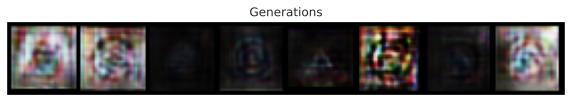

Epoch: 191, discrimiantor fake error: 0.243, discriminator real acc: 0.753
Epoch: 192, discrimiantor fake error: 0.248, discriminator real acc: 0.755
Epoch: 193, discrimiantor fake error: 0.249, discriminator real acc: 0.755
Epoch: 194, discrimiantor fake error: 0.256, discriminator real acc: 0.75
Epoch: 195, discrimiantor fake error: 0.247, discriminator real acc: 0.757
Epoch: 196, discrimiantor fake error: 0.24, discriminator real acc: 0.756
Epoch: 197, discrimiantor fake error: 0.237, discriminator real acc: 0.757
Epoch: 198, discrimiantor fake error: 0.249, discriminator real acc: 0.76
Epoch: 199, discrimiantor fake error: 0.23, discriminator real acc: 0.767
Epoch: 200, discrimiantor fake error: 0.251, discriminator real acc: 0.75


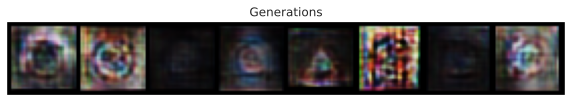

Epoch: 201, discrimiantor fake error: 0.233, discriminator real acc: 0.77
Epoch: 202, discrimiantor fake error: 0.235, discriminator real acc: 0.769
Epoch: 203, discrimiantor fake error: 0.246, discriminator real acc: 0.755
Epoch: 204, discrimiantor fake error: 0.25, discriminator real acc: 0.754
Epoch: 205, discrimiantor fake error: 0.24, discriminator real acc: 0.759
Epoch: 206, discrimiantor fake error: 0.245, discriminator real acc: 0.756
Epoch: 207, discrimiantor fake error: 0.241, discriminator real acc: 0.764
Epoch: 208, discrimiantor fake error: 0.235, discriminator real acc: 0.766
Epoch: 209, discrimiantor fake error: 0.241, discriminator real acc: 0.764
Epoch: 210, discrimiantor fake error: 0.251, discriminator real acc: 0.748


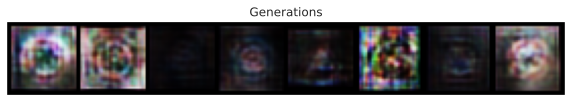

Epoch: 211, discrimiantor fake error: 0.229, discriminator real acc: 0.769
Epoch: 212, discrimiantor fake error: 0.246, discriminator real acc: 0.762
Epoch: 213, discrimiantor fake error: 0.24, discriminator real acc: 0.764
Epoch: 214, discrimiantor fake error: 0.23, discriminator real acc: 0.774
Epoch: 215, discrimiantor fake error: 0.241, discriminator real acc: 0.764
Epoch: 216, discrimiantor fake error: 0.227, discriminator real acc: 0.772
Epoch: 217, discrimiantor fake error: 0.236, discriminator real acc: 0.765
Epoch: 218, discrimiantor fake error: 0.243, discriminator real acc: 0.761
Epoch: 219, discrimiantor fake error: 0.242, discriminator real acc: 0.761
Epoch: 220, discrimiantor fake error: 0.225, discriminator real acc: 0.777


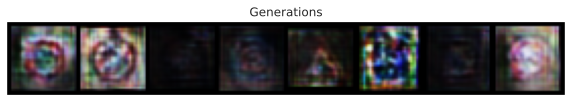

Epoch: 221, discrimiantor fake error: 0.22, discriminator real acc: 0.774
Epoch: 222, discrimiantor fake error: 0.223, discriminator real acc: 0.776
Epoch: 223, discrimiantor fake error: 0.227, discriminator real acc: 0.77
Epoch: 224, discrimiantor fake error: 0.222, discriminator real acc: 0.777
Epoch: 225, discrimiantor fake error: 0.227, discriminator real acc: 0.777
Epoch: 226, discrimiantor fake error: 0.226, discriminator real acc: 0.773
Epoch: 227, discrimiantor fake error: 0.234, discriminator real acc: 0.768
Epoch: 228, discrimiantor fake error: 0.243, discriminator real acc: 0.761
Epoch: 229, discrimiantor fake error: 0.246, discriminator real acc: 0.757
Epoch: 230, discrimiantor fake error: 0.238, discriminator real acc: 0.766


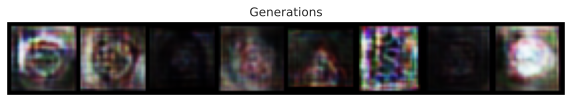

Epoch: 231, discrimiantor fake error: 0.243, discriminator real acc: 0.761
Epoch: 232, discrimiantor fake error: 0.234, discriminator real acc: 0.771
Epoch: 233, discrimiantor fake error: 0.233, discriminator real acc: 0.774
Epoch: 234, discrimiantor fake error: 0.232, discriminator real acc: 0.772
Epoch: 235, discrimiantor fake error: 0.241, discriminator real acc: 0.763
Epoch: 236, discrimiantor fake error: 0.239, discriminator real acc: 0.766
Epoch: 237, discrimiantor fake error: 0.238, discriminator real acc: 0.766
Epoch: 238, discrimiantor fake error: 0.24, discriminator real acc: 0.763
Epoch: 239, discrimiantor fake error: 0.234, discriminator real acc: 0.768
Epoch: 240, discrimiantor fake error: 0.226, discriminator real acc: 0.774


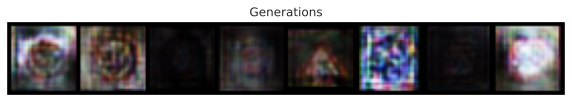

Epoch: 241, discrimiantor fake error: 0.229, discriminator real acc: 0.776
Epoch: 242, discrimiantor fake error: 0.23, discriminator real acc: 0.772
Epoch: 243, discrimiantor fake error: 0.243, discriminator real acc: 0.757
Epoch: 244, discrimiantor fake error: 0.236, discriminator real acc: 0.768
Epoch: 245, discrimiantor fake error: 0.234, discriminator real acc: 0.768
Epoch: 246, discrimiantor fake error: 0.224, discriminator real acc: 0.777
Epoch: 247, discrimiantor fake error: 0.23, discriminator real acc: 0.771
Epoch: 248, discrimiantor fake error: 0.242, discriminator real acc: 0.762
Epoch: 249, discrimiantor fake error: 0.232, discriminator real acc: 0.77
Epoch: 250, discrimiantor fake error: 0.236, discriminator real acc: 0.766


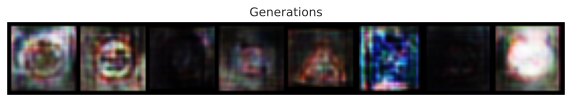

Epoch: 251, discrimiantor fake error: 0.226, discriminator real acc: 0.77
Epoch: 252, discrimiantor fake error: 0.235, discriminator real acc: 0.765
Epoch: 253, discrimiantor fake error: 0.237, discriminator real acc: 0.762
Epoch: 254, discrimiantor fake error: 0.236, discriminator real acc: 0.769
Epoch: 255, discrimiantor fake error: 0.235, discriminator real acc: 0.768
Epoch: 256, discrimiantor fake error: 0.248, discriminator real acc: 0.759
Epoch: 257, discrimiantor fake error: 0.256, discriminator real acc: 0.753
Epoch: 258, discrimiantor fake error: 0.235, discriminator real acc: 0.763
Epoch: 259, discrimiantor fake error: 0.232, discriminator real acc: 0.769
Epoch: 260, discrimiantor fake error: 0.239, discriminator real acc: 0.758


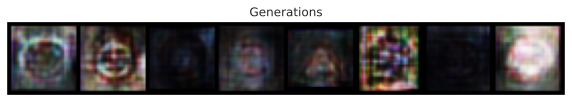

Epoch: 261, discrimiantor fake error: 0.249, discriminator real acc: 0.757
Epoch: 262, discrimiantor fake error: 0.243, discriminator real acc: 0.757
Epoch: 263, discrimiantor fake error: 0.237, discriminator real acc: 0.763
Epoch: 264, discrimiantor fake error: 0.231, discriminator real acc: 0.769
Epoch: 265, discrimiantor fake error: 0.235, discriminator real acc: 0.764
Epoch: 266, discrimiantor fake error: 0.244, discriminator real acc: 0.76
Epoch: 267, discrimiantor fake error: 0.244, discriminator real acc: 0.759
Epoch: 268, discrimiantor fake error: 0.235, discriminator real acc: 0.771
Epoch: 269, discrimiantor fake error: 0.236, discriminator real acc: 0.766
Epoch: 270, discrimiantor fake error: 0.244, discriminator real acc: 0.761


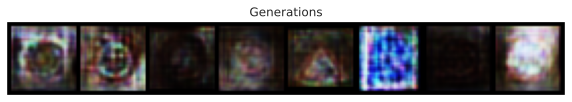

Epoch: 271, discrimiantor fake error: 0.23, discriminator real acc: 0.767
Epoch: 272, discrimiantor fake error: 0.248, discriminator real acc: 0.755
Epoch: 273, discrimiantor fake error: 0.234, discriminator real acc: 0.766
Epoch: 274, discrimiantor fake error: 0.228, discriminator real acc: 0.768
Epoch: 275, discrimiantor fake error: 0.241, discriminator real acc: 0.763
Epoch: 276, discrimiantor fake error: 0.25, discriminator real acc: 0.751
Epoch: 277, discrimiantor fake error: 0.234, discriminator real acc: 0.771
Epoch: 278, discrimiantor fake error: 0.243, discriminator real acc: 0.763
Epoch: 279, discrimiantor fake error: 0.243, discriminator real acc: 0.757
Epoch: 280, discrimiantor fake error: 0.244, discriminator real acc: 0.758


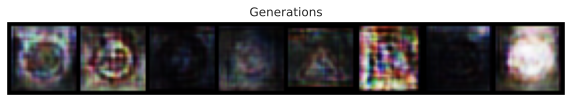

Epoch: 281, discrimiantor fake error: 0.248, discriminator real acc: 0.755
Epoch: 282, discrimiantor fake error: 0.244, discriminator real acc: 0.758
Epoch: 283, discrimiantor fake error: 0.237, discriminator real acc: 0.763
Epoch: 284, discrimiantor fake error: 0.247, discriminator real acc: 0.752
Epoch: 285, discrimiantor fake error: 0.251, discriminator real acc: 0.746
Epoch: 286, discrimiantor fake error: 0.245, discriminator real acc: 0.755
Epoch: 287, discrimiantor fake error: 0.245, discriminator real acc: 0.758
Epoch: 288, discrimiantor fake error: 0.252, discriminator real acc: 0.752
Epoch: 289, discrimiantor fake error: 0.252, discriminator real acc: 0.751
Epoch: 290, discrimiantor fake error: 0.247, discriminator real acc: 0.756


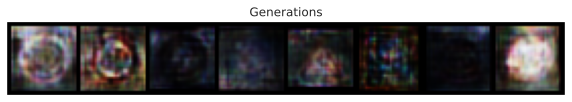

Epoch: 291, discrimiantor fake error: 0.247, discriminator real acc: 0.754
Epoch: 292, discrimiantor fake error: 0.244, discriminator real acc: 0.759
Epoch: 293, discrimiantor fake error: 0.243, discriminator real acc: 0.758
Epoch: 294, discrimiantor fake error: 0.244, discriminator real acc: 0.761
Epoch: 295, discrimiantor fake error: 0.24, discriminator real acc: 0.765
Epoch: 296, discrimiantor fake error: 0.239, discriminator real acc: 0.764
Epoch: 297, discrimiantor fake error: 0.245, discriminator real acc: 0.759
Epoch: 298, discrimiantor fake error: 0.246, discriminator real acc: 0.759
Epoch: 299, discrimiantor fake error: 0.245, discriminator real acc: 0.759
Epoch: 300, discrimiantor fake error: 0.242, discriminator real acc: 0.759


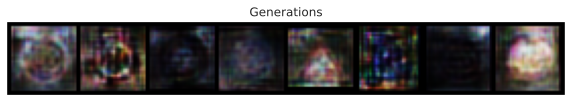

Epoch: 301, discrimiantor fake error: 0.238, discriminator real acc: 0.762
Epoch: 302, discrimiantor fake error: 0.237, discriminator real acc: 0.766
Epoch: 303, discrimiantor fake error: 0.241, discriminator real acc: 0.762
Epoch: 304, discrimiantor fake error: 0.241, discriminator real acc: 0.761
Epoch: 305, discrimiantor fake error: 0.241, discriminator real acc: 0.764
Epoch: 306, discrimiantor fake error: 0.239, discriminator real acc: 0.762
Epoch: 307, discrimiantor fake error: 0.242, discriminator real acc: 0.762
Epoch: 308, discrimiantor fake error: 0.236, discriminator real acc: 0.763
Epoch: 309, discrimiantor fake error: 0.239, discriminator real acc: 0.762
Epoch: 310, discrimiantor fake error: 0.243, discriminator real acc: 0.757


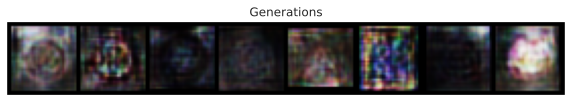

Epoch: 311, discrimiantor fake error: 0.251, discriminator real acc: 0.754
Epoch: 312, discrimiantor fake error: 0.255, discriminator real acc: 0.753
Epoch: 313, discrimiantor fake error: 0.252, discriminator real acc: 0.747
Epoch: 314, discrimiantor fake error: 0.252, discriminator real acc: 0.753
Epoch: 315, discrimiantor fake error: 0.247, discriminator real acc: 0.76
Epoch: 316, discrimiantor fake error: 0.244, discriminator real acc: 0.761
Epoch: 317, discrimiantor fake error: 0.241, discriminator real acc: 0.756
Epoch: 318, discrimiantor fake error: 0.239, discriminator real acc: 0.764
Epoch: 319, discrimiantor fake error: 0.239, discriminator real acc: 0.763
Epoch: 320, discrimiantor fake error: 0.244, discriminator real acc: 0.76


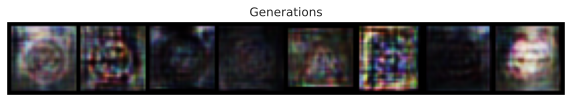

Epoch: 321, discrimiantor fake error: 0.244, discriminator real acc: 0.76
Epoch: 322, discrimiantor fake error: 0.234, discriminator real acc: 0.762
Epoch: 323, discrimiantor fake error: 0.245, discriminator real acc: 0.753
Epoch: 324, discrimiantor fake error: 0.245, discriminator real acc: 0.753
Epoch: 325, discrimiantor fake error: 0.246, discriminator real acc: 0.757
Epoch: 326, discrimiantor fake error: 0.251, discriminator real acc: 0.755
Epoch: 327, discrimiantor fake error: 0.248, discriminator real acc: 0.756
Epoch: 328, discrimiantor fake error: 0.246, discriminator real acc: 0.754
Epoch: 329, discrimiantor fake error: 0.255, discriminator real acc: 0.741
Epoch: 330, discrimiantor fake error: 0.252, discriminator real acc: 0.746


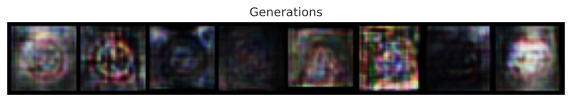

Epoch: 331, discrimiantor fake error: 0.248, discriminator real acc: 0.751
Epoch: 332, discrimiantor fake error: 0.249, discriminator real acc: 0.757
Epoch: 333, discrimiantor fake error: 0.247, discriminator real acc: 0.756
Epoch: 334, discrimiantor fake error: 0.246, discriminator real acc: 0.753
Epoch: 335, discrimiantor fake error: 0.254, discriminator real acc: 0.75
Epoch: 336, discrimiantor fake error: 0.253, discriminator real acc: 0.747
Epoch: 337, discrimiantor fake error: 0.255, discriminator real acc: 0.744
Epoch: 338, discrimiantor fake error: 0.254, discriminator real acc: 0.749
Epoch: 339, discrimiantor fake error: 0.255, discriminator real acc: 0.747
Epoch: 340, discrimiantor fake error: 0.253, discriminator real acc: 0.747


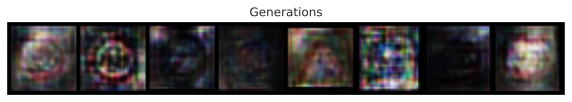

Epoch: 341, discrimiantor fake error: 0.248, discriminator real acc: 0.75
Epoch: 342, discrimiantor fake error: 0.245, discriminator real acc: 0.748
Epoch: 343, discrimiantor fake error: 0.246, discriminator real acc: 0.746
Epoch: 344, discrimiantor fake error: 0.247, discriminator real acc: 0.753
Epoch: 345, discrimiantor fake error: 0.246, discriminator real acc: 0.754
Epoch: 346, discrimiantor fake error: 0.245, discriminator real acc: 0.756
Epoch: 347, discrimiantor fake error: 0.242, discriminator real acc: 0.758
Epoch: 348, discrimiantor fake error: 0.236, discriminator real acc: 0.762
Epoch: 349, discrimiantor fake error: 0.233, discriminator real acc: 0.765
Epoch: 350, discrimiantor fake error: 0.236, discriminator real acc: 0.765


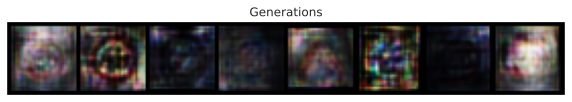

Epoch: 351, discrimiantor fake error: 0.242, discriminator real acc: 0.763
Epoch: 352, discrimiantor fake error: 0.244, discriminator real acc: 0.76
Epoch: 353, discrimiantor fake error: 0.245, discriminator real acc: 0.763
Epoch: 354, discrimiantor fake error: 0.239, discriminator real acc: 0.76
Epoch: 355, discrimiantor fake error: 0.238, discriminator real acc: 0.761
Epoch: 356, discrimiantor fake error: 0.243, discriminator real acc: 0.76
Epoch: 357, discrimiantor fake error: 0.241, discriminator real acc: 0.759
Epoch: 358, discrimiantor fake error: 0.243, discriminator real acc: 0.76
Epoch: 359, discrimiantor fake error: 0.24, discriminator real acc: 0.762
Epoch: 360, discrimiantor fake error: 0.238, discriminator real acc: 0.767


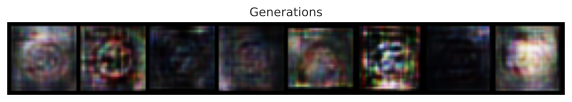

Epoch: 361, discrimiantor fake error: 0.237, discriminator real acc: 0.766
Epoch: 362, discrimiantor fake error: 0.238, discriminator real acc: 0.765
Epoch: 363, discrimiantor fake error: 0.241, discriminator real acc: 0.762
Epoch: 364, discrimiantor fake error: 0.24, discriminator real acc: 0.762
Epoch: 365, discrimiantor fake error: 0.244, discriminator real acc: 0.76
Epoch: 366, discrimiantor fake error: 0.246, discriminator real acc: 0.756
Epoch: 367, discrimiantor fake error: 0.245, discriminator real acc: 0.759
Epoch: 368, discrimiantor fake error: 0.245, discriminator real acc: 0.756
Epoch: 369, discrimiantor fake error: 0.242, discriminator real acc: 0.759
Epoch: 370, discrimiantor fake error: 0.242, discriminator real acc: 0.76


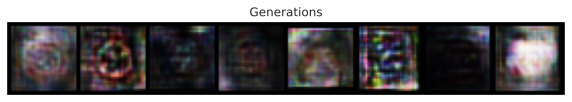

Epoch: 371, discrimiantor fake error: 0.244, discriminator real acc: 0.756
Epoch: 372, discrimiantor fake error: 0.244, discriminator real acc: 0.755
Epoch: 373, discrimiantor fake error: 0.249, discriminator real acc: 0.75
Epoch: 374, discrimiantor fake error: 0.248, discriminator real acc: 0.752
Epoch: 375, discrimiantor fake error: 0.248, discriminator real acc: 0.748
Epoch: 376, discrimiantor fake error: 0.248, discriminator real acc: 0.75
Epoch: 377, discrimiantor fake error: 0.25, discriminator real acc: 0.754
Epoch: 378, discrimiantor fake error: 0.248, discriminator real acc: 0.752
Epoch: 379, discrimiantor fake error: 0.247, discriminator real acc: 0.755
Epoch: 380, discrimiantor fake error: 0.242, discriminator real acc: 0.758


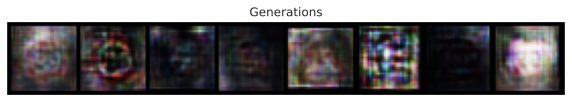

Epoch: 381, discrimiantor fake error: 0.241, discriminator real acc: 0.757
Epoch: 382, discrimiantor fake error: 0.242, discriminator real acc: 0.756
Epoch: 383, discrimiantor fake error: 0.242, discriminator real acc: 0.757
Epoch: 384, discrimiantor fake error: 0.241, discriminator real acc: 0.756
Epoch: 385, discrimiantor fake error: 0.242, discriminator real acc: 0.757
Epoch: 386, discrimiantor fake error: 0.243, discriminator real acc: 0.757
Epoch: 387, discrimiantor fake error: 0.246, discriminator real acc: 0.756
Epoch: 388, discrimiantor fake error: 0.247, discriminator real acc: 0.754
Epoch: 389, discrimiantor fake error: 0.247, discriminator real acc: 0.757
Epoch: 390, discrimiantor fake error: 0.242, discriminator real acc: 0.758


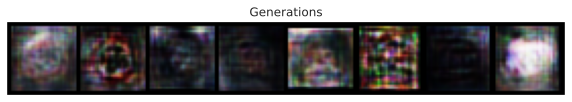

Epoch: 391, discrimiantor fake error: 0.242, discriminator real acc: 0.759
Epoch: 392, discrimiantor fake error: 0.244, discriminator real acc: 0.759
Epoch: 393, discrimiantor fake error: 0.245, discriminator real acc: 0.758
Epoch: 394, discrimiantor fake error: 0.245, discriminator real acc: 0.758
Epoch: 395, discrimiantor fake error: 0.245, discriminator real acc: 0.759
Epoch: 396, discrimiantor fake error: 0.244, discriminator real acc: 0.759
Epoch: 397, discrimiantor fake error: 0.244, discriminator real acc: 0.759
Epoch: 398, discrimiantor fake error: 0.244, discriminator real acc: 0.76
Epoch: 399, discrimiantor fake error: 0.243, discriminator real acc: 0.761
Epoch: 400, discrimiantor fake error: 0.242, discriminator real acc: 0.762


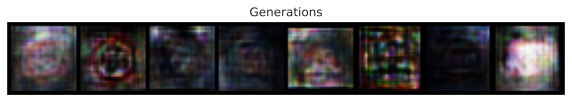

Epoch: 401, discrimiantor fake error: 0.242, discriminator real acc: 0.762


KeyboardInterrupt: 

In [70]:
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        classes_encoded = get_classes_encoded(train_classes, data[1], encoding).to(device)
        real_images = data[0].to(device)

        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images
        # Forward pass real batch through D
        output = discriminator(real_images, classes_encoded).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latent_dim,device=device)
        fake_images = generator(noise, classes_encoded)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)
        output = discriminator(fake_images.detach(), classes_encoded).view(-1)
        error_discriminator_fake = criterion(output, label_fake)
        discriminator_fake_acc.append(output.mean().item())
        error_discriminator = error_discriminator_real + error_discriminator_fake
        error_discriminator.backward()
        discriminator_optimizer.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost

        output = discriminator(fake_images, classes_encoded).view(-1)
        error_generator = criterion(output, label)
        error_generator.backward()
        D_G_z2 = output.mean().item()
        generator_optimizer.step()

    
        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())
        DF_acc.append(np.mean(discriminator_fake_acc))
        DR_acc.append(np.mean(discriminator_real_acc))

    print(f"Epoch: {epoch}, discrimiantor fake error: {DF_acc[-1]:.3}, discriminator real acc: {DR_acc[-1]:.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
   
    if epoch % 10 == 0:
        classes_encoded_small = get_classes_encoded(train_classes, [torch.tensor(1), torch.tensor(2),torch.tensor(3),torch.tensor(16),torch.tensor(23),\
                                                                torch.tensor(34),torch.tensor(8),torch.tensor(9)], encoding).to(device)
        with torch.no_grad():
            fake = generator(fixed_noise, classes_encoded_small).detach().cpu()
        grid = torchvision.utils.make_grid(fake)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

In [71]:
def get_train_images(num):
    return torch.stack([train_data[i][0] for i in range(10,10+num)], dim=0)

In [72]:
input_imgs = get_train_images(8)

In [73]:
def generate_images(model, n_imgs, device):
    # Generate images
    model.eval()
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=n_imgs, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
    images, labels = next(iter(train_loader))
    # classes_to_generate = torch.concat((rmd_to_genrate, encoding[:n_imgs]), dim=1).to(device)
    # print(classes_to_generate)
    fixed_noise = torch.randn(n_imgs, 32 ,device=device).to(device)
    # rmd_to_genrate = torch.randn([12, 32]).to(device)
    encoded_classes = get_classes_encoded(train_classes, labels, encoding).to(device)
    with torch.no_grad():
        generated_imgs = model(fixed_noise, encoded_classes).to(device)
    generated_imgs = generated_imgs.cpu()


    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=False, value_range=(-1,1))
    grid = grid.permute(1, 2, 0)
    if len(input_imgs) == 4:
        plt.figure(figsize=(10,10))
    else:
        plt.figure(figsize=(15,10))
    plt.title(f"Generations")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

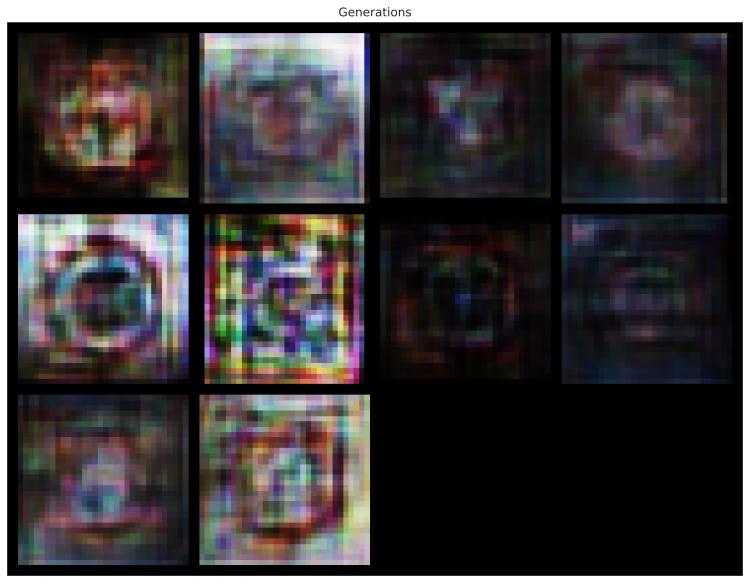

In [76]:
generate_images(generator, 10, device)

In [80]:
torch.save(generator.state_dict(), 'generatorBig.pt')
torch.save(generator.state_dict(), 'discriminatorBig.pt')

In [78]:
def im_save(img, path):
    #img = img / 2 + 0.5     # unnormalize
    save_image(img, path)

def evaluate_model(model, train_data, encoding: list, train_classes, n_imgs):
    model.eval()
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=n_imgs, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
    images, labels = next(iter(train_loader))
    fixed_noise = torch.randn(n_imgs, 32 ,device=device).to(device)
    encoded_classes = get_classes_encoded(train_classes, labels, encoding).to(device)
    with torch.no_grad():
        generated_imgs = model(fixed_noise, encoded_classes).to(device)
    generated_imgs = generated_imgs.cpu()
    
    
    for j, img in enumerate(generated_imgs):
        im_save(img, f'gen_eval/img{j}.jpg')
    for j, img in enumerate(images):
        im_save(img, f'real_eval/img{j}.jpg')
    paths = ['real_eval', 'gen_eval']
    return fid_score.calculate_fid_given_paths(paths, batch_size=200, device='cuda', dims=2048)


In [79]:
evaluate_model(generator, train_data, encoding, train_classes, 256)

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
25.7%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

74.3%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100.0%


217.68349130227367